In [2]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'          # Warning: Very Important to Run at the beginning

In [3]:
import torch
from matplotlib import pyplot as plt
import numpy as np
import cv2
from ultralytics import YOLO
import random

In [4]:
model = YOLO(r"yolov8n.pt") #Load a COCO pre-trained YOLO model

In [5]:
model.to('cpu')   #Explicitly move model to CPU

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [6]:
images_path=r"C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\train\images"
annotations_paths=r"C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\train\labels"

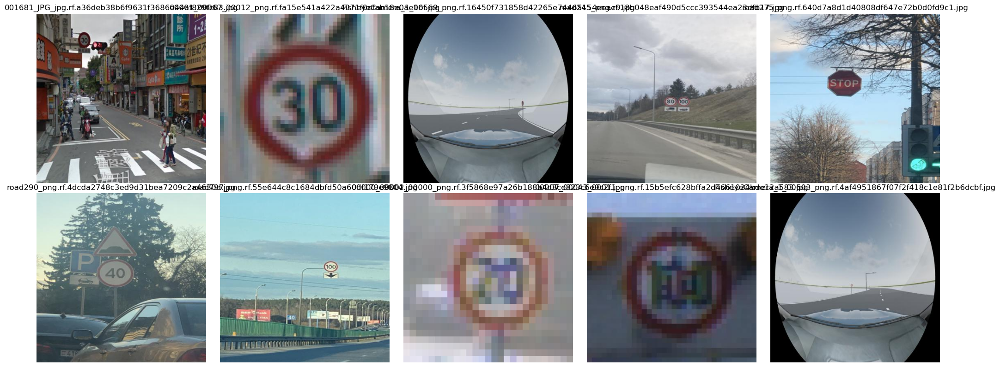

In [23]:
 #Select ten random images to display
sample_images = random.sample(os.listdir(images_path), 10)
# Display the images
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for ax, img_file in zip(axs.flatten(), sample_images):
    img_path = os.path.join(images_path, img_file)
    img = cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_file)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [8]:
path=r"C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\data.yaml"

### Train YOLOv8 Model on dataset: https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6

In [13]:
   #Train the model
results=model.train( data=path, epochs=50, imgsz=416, batch=8)

New https://pypi.org/project/ultralytics/8.3.113 available  Update with 'pip install -U ultralytics'
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=416, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf

train: Scanning C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\train\labels.cac

val: Fast image access  (ping: 0.10.0 ms, read: 199.3118.0 MB/s, size: 20.7 KB)



val: Scanning C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\valid\labels.cache


Plotting labels to runs\detect\train2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs\detect\train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.538      3.555        1.6          5        416: 100%|██████████| 442/442 [10:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [01:22


                   all        801        944      0.175      0.428      0.186      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G     0.8683      2.511      1.147          5        416: 100%|██████████| 442/442 [10:25<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:55

                   all        801        944       0.25       0.44      0.264      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G     0.7851      2.198      1.083          2        416: 100%|██████████| 442/442 [08:53<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:45

                   all        801        944      0.237      0.513      0.291      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G     0.7433      1.997      1.041          2        416: 100%|██████████| 442/442 [06:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:37

                   all        801        944      0.324      0.472      0.376      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G     0.7202      1.832      1.023          2        416: 100%|██████████| 442/442 [06:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:39

                   all        801        944      0.351      0.493      0.418      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G     0.7035      1.706      1.008          3        416: 100%|██████████| 442/442 [06:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:37

                   all        801        944      0.464       0.54      0.512      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G     0.6782      1.568     0.9985          2        416: 100%|██████████| 442/442 [06:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:37

                   all        801        944      0.518      0.549      0.546      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G     0.6846      1.497     0.9948          3        416: 100%|██████████| 442/442 [06:32<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:38

                   all        801        944      0.543      0.569      0.577      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G     0.6635      1.387     0.9861          8        416: 100%|██████████| 442/442 [06:31<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:38

                   all        801        944      0.649      0.624      0.665      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G     0.6562      1.317     0.9736          3        416: 100%|██████████| 442/442 [06:32<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:39

                   all        801        944      0.669      0.684      0.704      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G     0.6332      1.251      0.974          4        416: 100%|██████████| 442/442 [06:31<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:38

                   all        801        944      0.679      0.699      0.736      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G     0.6404      1.196     0.9731          7        416: 100%|██████████| 442/442 [06:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.749      0.694      0.767      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G     0.6255      1.124     0.9698          5        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.745      0.711      0.767      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G     0.6168       1.08      0.962          7        416: 100%|██████████| 442/442 [06:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.846      0.699      0.793      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G     0.6175      1.043     0.9578          3        416: 100%|██████████| 442/442 [06:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.869      0.705       0.81      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G     0.6067      1.018     0.9596          5        416: 100%|██████████| 442/442 [06:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.826      0.725      0.814      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G     0.6122      1.005     0.9585          5        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.846      0.723      0.817      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G     0.5962     0.9503     0.9568          5        416: 100%|██████████| 442/442 [06:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.876      0.752      0.841      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G     0.6035     0.9248     0.9523          5        416: 100%|██████████| 442/442 [06:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.902      0.748      0.845      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G     0.5941     0.9104     0.9543          5        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.902      0.756      0.851      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G     0.5947     0.9033     0.9514          9        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944        0.9      0.764      0.851      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G     0.6016     0.8816     0.9502          6        416: 100%|██████████| 442/442 [06:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.886      0.768      0.852      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G     0.5913     0.8615     0.9474          4        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.929      0.762      0.861      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G     0.5903     0.8506     0.9494          3        416: 100%|██████████| 442/442 [06:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.927      0.774       0.86      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G     0.5887     0.8551     0.9463          2        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.863      0.787       0.86      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      0.573     0.8255     0.9431          3        416: 100%|██████████| 442/442 [06:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.903      0.783      0.868      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G     0.5706     0.7987     0.9415          6        416: 100%|██████████| 442/442 [06:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.878      0.786      0.861      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G     0.5609     0.8002     0.9374          2        416: 100%|██████████| 442/442 [06:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.917      0.789      0.874      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G     0.5724     0.7913     0.9361          2        416: 100%|██████████| 442/442 [06:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.887      0.803      0.875      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G     0.5585      0.769     0.9321          7        416: 100%|██████████| 442/442 [06:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944       0.91      0.795      0.877      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G     0.5705     0.7634     0.9334          5        416: 100%|██████████| 442/442 [06:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.935      0.784      0.877      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G     0.5687     0.7726     0.9397          3        416: 100%|██████████| 442/442 [06:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.935      0.795       0.88      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G     0.5673     0.7499     0.9339          5        416: 100%|██████████| 442/442 [06:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:34

                   all        801        944      0.897      0.806      0.878      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G     0.5611     0.7461     0.9337          6        416: 100%|██████████| 442/442 [06:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:34

                   all        801        944      0.923        0.8      0.882      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G     0.5569     0.7436     0.9337          4        416: 100%|██████████| 442/442 [06:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.925      0.798      0.882       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      0.561     0.7321     0.9336          2        416: 100%|██████████| 442/442 [06:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.923      0.805      0.882      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G     0.5522     0.7234     0.9351          3        416: 100%|██████████| 442/442 [06:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.915      0.806       0.88      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G     0.5533     0.7138     0.9285          2        416: 100%|██████████| 442/442 [06:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.936      0.795      0.887      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G     0.5465     0.6988     0.9278          4        416: 100%|██████████| 442/442 [06:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.897      0.823      0.887      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G     0.5476     0.7121     0.9296          3        416: 100%|██████████| 442/442 [06:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.923      0.804      0.886      0.773


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G     0.5301     0.4727     0.8726          3        416: 100%|██████████| 442/442 [05:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.935      0.805      0.886      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G     0.5202     0.4517     0.8741          2        416: 100%|██████████| 442/442 [05:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.943      0.794      0.891      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G     0.5192     0.4402     0.8705          2        416: 100%|██████████| 442/442 [05:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.931      0.811      0.891      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G     0.5146     0.4427     0.8709          2        416: 100%|██████████| 442/442 [06:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.929      0.804      0.892      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      0.512     0.4317     0.8711          2        416: 100%|██████████| 442/442 [05:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.934      0.804      0.893      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G     0.5088     0.4203     0.8726          2        416: 100%|██████████| 442/442 [05:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.902      0.829      0.895      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G     0.5147     0.4223     0.8657          4        416: 100%|██████████| 442/442 [05:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:36

                   all        801        944      0.921      0.814      0.896       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G     0.5068     0.4248      0.863          2        416: 100%|██████████| 442/442 [05:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944       0.93      0.815      0.896      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      0.506     0.4217     0.8622          3        416: 100%|██████████| 442/442 [05:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.907      0.824      0.897      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G     0.5032     0.4153     0.8673          2        416: 100%|██████████| 442/442 [05:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35

                   all        801        944      0.933      0.817      0.899      0.785



50 epochs completed in 5.829 hours.
Optimizer stripped from runs\detect\train2\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train2\weights\best.pt, 6.2MB

Validating runs\detect\train2\weights\best.pt...
Ultralytics 8.3.112  Python-3.12.7 torch-2.6.0+cpu CPU (11th Gen Intel Core(TM) i7-11370H 3.30GHz)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:27


                   all        801        944      0.933      0.817      0.899      0.785
           Green Light         87        122      0.839      0.533      0.667      0.393
             Red Light         74        108      0.799      0.516      0.668      0.386
       Speed Limit 100         52         52      0.906      0.942      0.962      0.876
       Speed Limit 110         17         17      0.933      0.815      0.947      0.895
       Speed Limit 120         60         60      0.992      0.867       0.97      0.883
        Speed Limit 20         56         56      0.988      0.893      0.966      0.839
        Speed Limit 30         71         74      0.951      0.905      0.962      0.899
        Speed Limit 40         53         55       0.95      0.873       0.96      0.848
        Speed Limit 50         68         71      0.966      0.796      0.913      0.828
        Speed Limit 60         76         76       0.98      0.855      0.929      0.851
        Speed Limit 7

In [9]:
model=YOLO(r'runs\detect\train2\weights\best.pt') #best.pt #best performed model

### Test the model on test images and display random 10 images each run from predictions folder

In [33]:
#Run inference on test images
import os
from PIL import Image
from IPython.display import display

# Run inference on test images
results = model(r"C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images", iou=0)

# Create predictions directory if it doesn't exist
os.makedirs("predictions", exist_ok=True)

# Save and display the results
for i, result in enumerate(results):
    save_path = os.path.join("predictions", f"pred_{i}.jpg")
    result.save(filename=save_path)  # Save prediction image
    #display(Image.open(save_path))   # Display in notebook



image 1/638 C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images\000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg: 416x416 1 Speed Limit 30, 50.8ms
image 2/638 C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images\000006_jpg.rf.89610ec419ccfab22f8314026b90ee26.jpg: 416x416 1 Speed Limit 30, 36.1ms
image 3/638 C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images\00000_00000_00003_png.rf.d18afc3c9625ffb1974029d3e3762aee.jpg: 416x416 1 Speed Limit 20, 40.5ms
image 4/638 C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images\00000_00000_00005_png.rf.ab60a274676963d378f5014e89d9e2b1.jpg: 416x416 1 Speed Limit 20, 46.3ms
image 5/638 C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images\00000_00000_00006_png.rf.9d1ea68507aff6973a1dbcdc6f4422a8.jpg: 416x416 1 Speed Lim

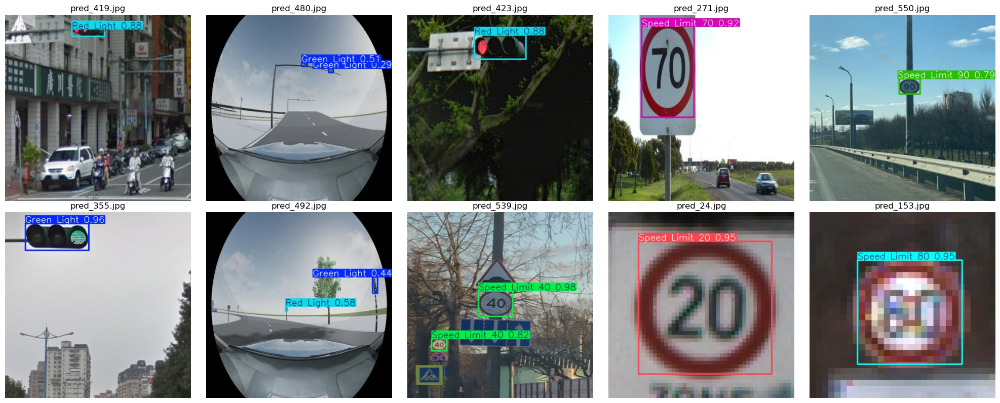

In [37]:
predict_folder = r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\predictions"
# Select 10 random images
sample_images = random.sample(os.listdir(predict_folder), 10)

# Display the images
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for ax, img_file in zip(axs.flatten(), sample_images):
    img_path = os.path.join(predict_folder, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_file)
    ax.axis('off')

plt.tight_layout()
plt.show()

### Test the model on Images from different region [Arabic and German]


0: 416x416 1 Stop, 38.4ms
1: 416x416 1 Speed Limit 30, 1 Stop, 38.4ms
Speed: 1.6ms preprocess, 38.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)


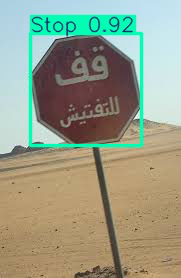

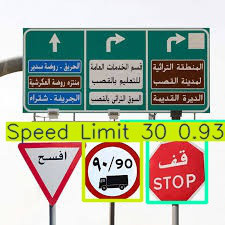

In [16]:
#Run Inference on Arabic Road Signs
base_path = r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\ArabicRoadSigns"
arabic_images = [os.path.join(base_path, f"AR_RS{i}.jpeg") for i in range(1, 3)]

# Run inference
results = model(arabic_images)

# Save predictions in a folder
os.makedirs("arabic_predictions", exist_ok=True)

# Save and display predictions
for i, result in enumerate(results):
    save_path = os.path.join("arabic_predictions", f"arabic_pred_{i+1}.jpg")
    result.save(filename=save_path)
    display(Image.open(save_path))


In [18]:
results=model(r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\ArabicRoadSigns\AR_RS3.jpg")


image 1/1 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\ArabicRoadSigns\AR_RS3.jpg: 416x320 1 Speed Limit 100, 44.1ms
Speed: 2.7ms preprocess, 44.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 320)


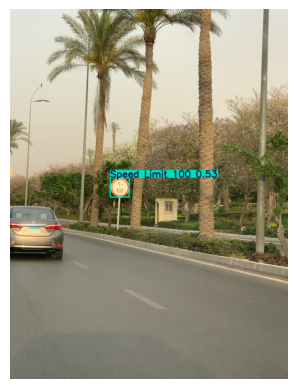

In [22]:
annotated_image=results[0].plot()
annotated_image=cv2.cvtColor(annotated_image,cv2.COLOR_BGR2RGB)
plt.imshow(annotated_image)
plt.axis('off')
plt.show()


image 1/110 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\GermanRoadSigns\00000.png: 416x416 1 Speed Limit 80, 37.5ms
image 2/110 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\GermanRoadSigns\00001.png: 416x416 1 Speed Limit 30, 32.9ms
image 3/110 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\GermanRoadSigns\00002.png: 416x384 (no detections), 44.0ms
image 4/110 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\GermanRoadSigns\00003.png: 416x416 (no detections), 35.3ms
image 5/110 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Proj

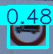

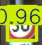

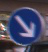

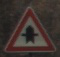

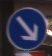

...

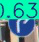

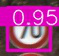

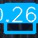

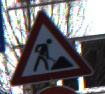

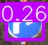

In [11]:
#Run inference on German Roadsigns

import os
from PIL import Image
from IPython.display import display

# Run inference on test images
results = model(r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\GermanRoadSigns", iou=0)

# Create predictions directory if it doesn't exist
os.makedirs("GermanPredictions", exist_ok=True)

# Save and display the results
for i, result in enumerate(results):
    save_path = os.path.join("GermanPredictions", f"pred_{i}.jpg")
    result.save(filename=save_path)  # Save prediction image
    display(Image.open(save_path))   # Display in notebook


### Simulate Wornout Images using Gaussian Blur (a data augmentation technique )

In [14]:
import cv2
import os

input_path = r"C:\Users\Mohamed Saleh\Downloads\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\test\images"
output_path = "AugmentedImages"

os.makedirs(output_path, exist_ok=True)

for file_name in os.listdir(input_path):
    if file_name.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(input_path, file_name)
        img = cv2.imread(img_path)

        # Apply Gaussian Blur
        blurred = cv2.GaussianBlur(img, (7, 7), 0)

        # Save blurred image
        cv2.imwrite(os.path.join(output_path, file_name), blurred)


### Display Detection of wornout signs (blurred or in a bad weather)
#### This is an example all predicted pictures are in specific folder by its title

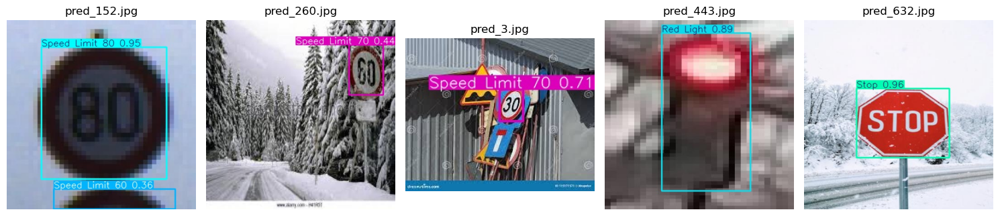

In [17]:

folder_path = r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\WornOutPredictions"

plt.figure(figsize=(15, 8))
i = 1

for file in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i)
    plt.imshow(img)
    plt.title(file)
    plt.axis('off')
    i += 1

plt.tight_layout()
plt.show()

### Display prediction of images from an autonomous vehicle camera

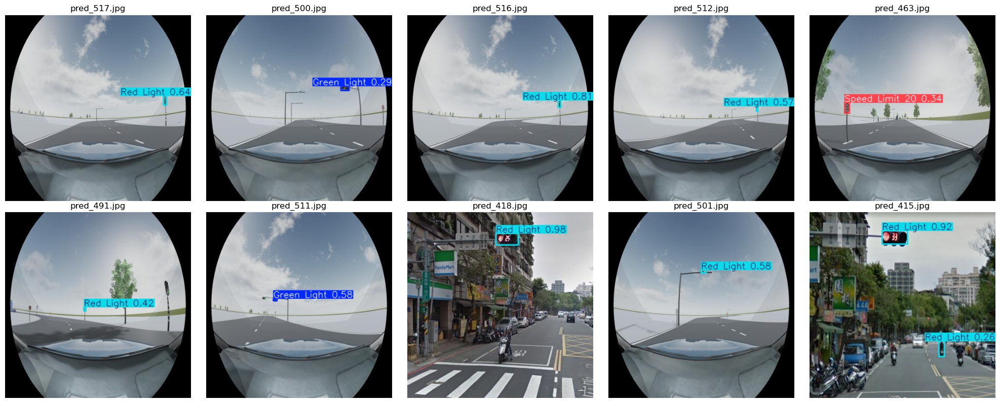

In [28]:
folder_path = r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\AutonomousVehiclePrediction"

# Select ten random images to display
sample_images = random.sample(os.listdir(folder_path), 10)

# Display the images
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for ax, img_file in zip(axs.flatten(), sample_images):
    img_path = os.path.join(folder_path, img_file) 
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_file)
    
    ax.axis('off')

plt.tight_layout()
plt.show()

### Run Inference on occlusion real life images

In [20]:
results = model(r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\occlusion2.png", iou=0)


image 1/1 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\occlusion2.png: 160x416 1 Speed Limit 120, 1 Speed Limit 40, 1 Stop, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.8ms postprocess per image at shape (1, 3, 160, 416)


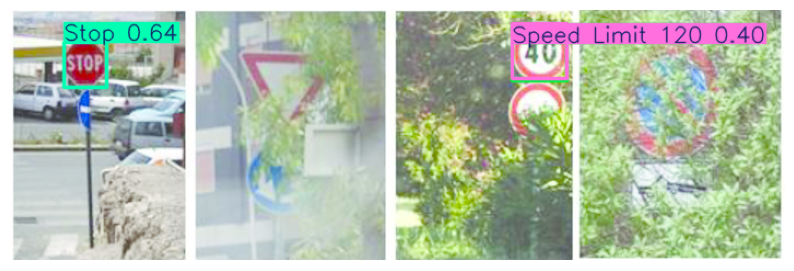

In [23]:
annotated_image=results[0].plot()
annotated_image=cv2.cvtColor(annotated_image,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,6))
plt.imshow(annotated_image)
plt.axis('off')
plt.show()

### Prediction on the valid set

In [30]:
results = model.predict(source=r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\valid\images"
                        , save=True, conf=0.25)


image 1/801 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\valid\images\000001_jpg.rf.5eb4f984823b1a44afc9bf98804daa50.jpg: 416x416 1 Speed Limit 30, 75.7ms
image 2/801 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\valid\images\000002_jpg.rf.d65ebeef4d1cb26e3fc1a826770b729f.jpg: 416x416 1 Speed Limit 30, 39.7ms
image 3/801 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\Self-Driving Cars.v6-version-4-prescan-416x416.yolov8\valid\images\000004_jpg.rf.00126fe7725236ec5dc849bac78543c2.jpg: 416x416 1 Speed Limit 30, 38.2ms
image 4/801 C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial I

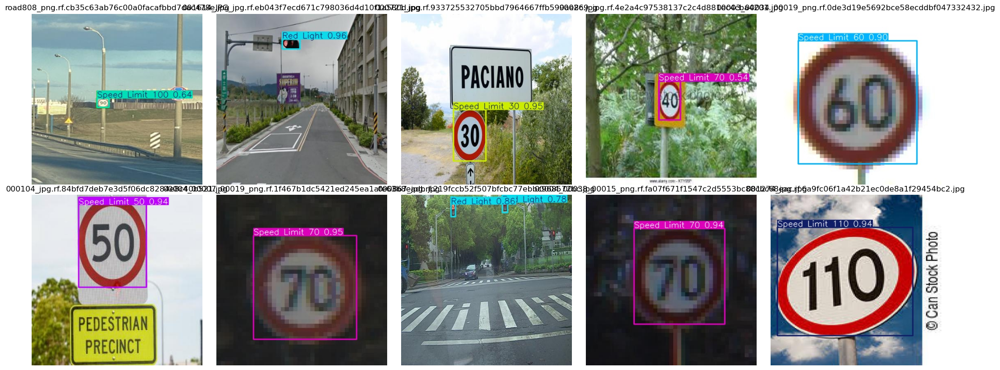

In [32]:
predict_folder = r"C:\Users\Mohamed Saleh\Documents\Documents\Computer Science\Artificial Intelligence\Semester 6\Visual Computing and Image Processing\Project\runs\detect\predict"

# Select 10 random images
sample_images = random.sample(os.listdir(predict_folder), 10)

# Display the images
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for ax, img_file in zip(axs.flatten(), sample_images):
    img_path = os.path.join(predict_folder, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_file)
    ax.axis('off')

plt.tight_layout()
plt.show()